# 0. Import packages

In [46]:
import os
import umap
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
from time import time
from torchvision import datasets, transforms

# 1. Load neuron embedding of the base model

In [16]:
def load_json(p):
    with open(p) as f:
        data = json.load(f)
    return data

def draw_scatter(Xs, title=None):
    X = Xs[:,0]
    Y = Xs[:,1]

    plt.figure(figsize=(4, 4))
    plt.scatter(X, Y, s=3, alpha=0.2)
    
    if title is not None:
        plt.title(title)
    plt.show()

In [9]:
p = '/raid/NeuEvo/data/embedding/emb-vgg19_pretrained-topk_s=20-dim=30-lr_emb=0.05-num_emb_epochs=10000-num_emb_negs=3/data/emb/emb.json'
emb_vgg19 = load_json(p)
num_neurons_vgg19 = len(emb_vgg19)

In [56]:
X_vgg19 = np.zeros((num_neurons_vgg19, 30))
idx2id_vgg19 = {}
for neuron_i, neuron in enumerate(emb_vgg19):
    X_vgg19[neuron_i] = emb_vgg19[neuron]
    idx2id_vgg19[neuron_i] = neuron

In [12]:
reducer = umap.UMAP(n_components=2)
reducer = reducer.fit(X_vgg19)
X_2d_vgg19 = reducer.embedding_

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


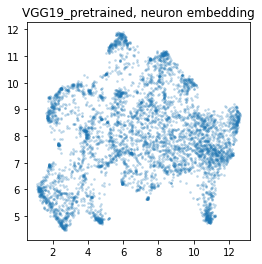

In [17]:
draw_scatter(X_2d_vgg19, 'VGG19_pretrained, neuron embedding')

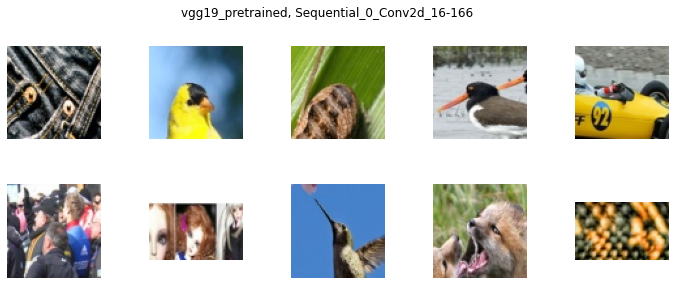

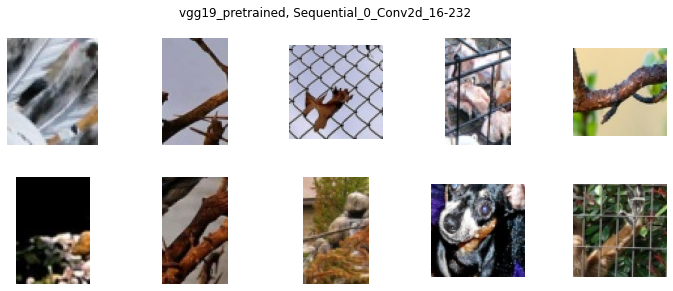

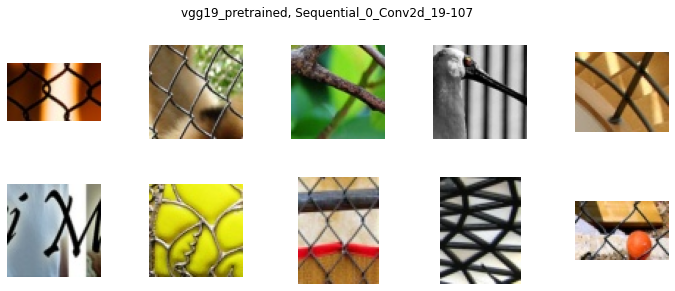

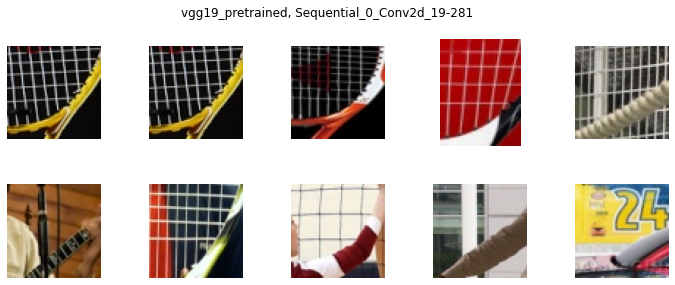

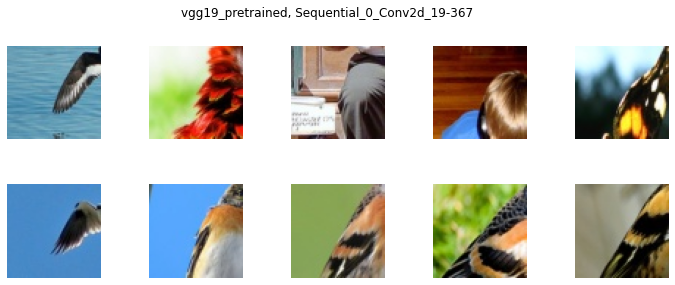

...

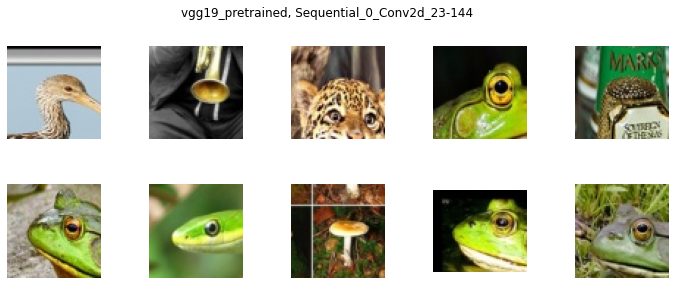

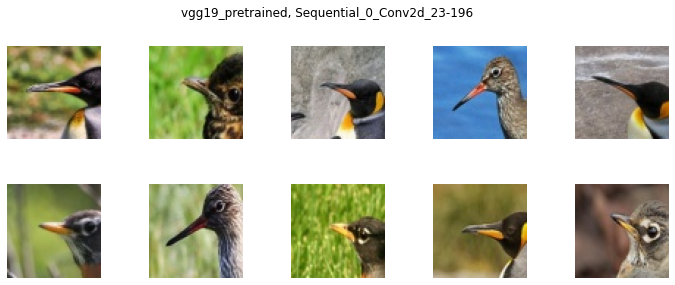

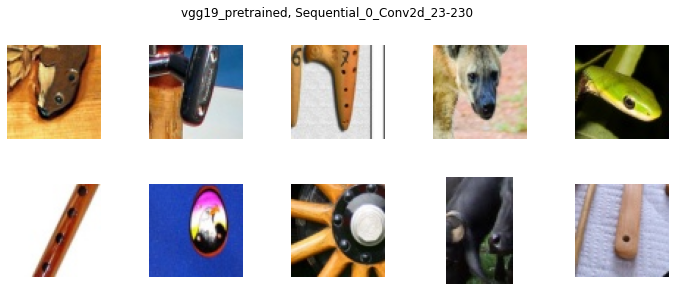

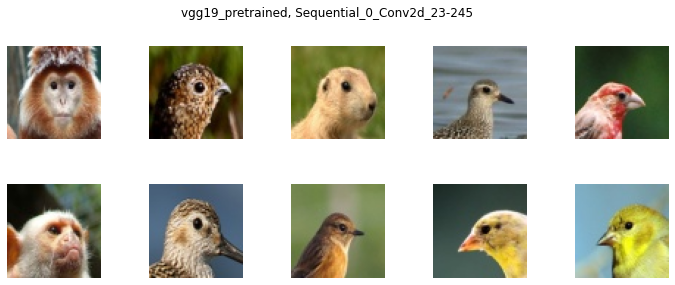

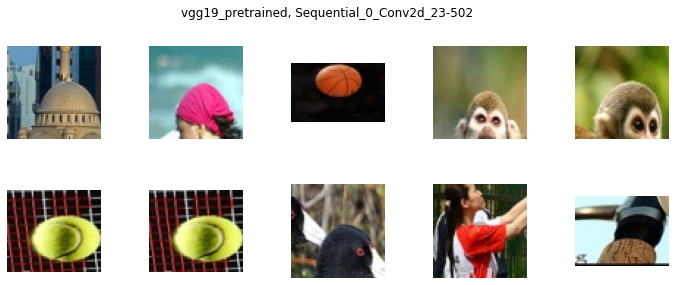

In [79]:
show_ex_patch_of_region([2, 4], [9, 10], X_2d_vgg19, idx2id_vgg19, 'vgg19_pretrained', topk_s=15, k=20)

# 2. Load image embedding

In [58]:
# p = '/raid/NeuEvo/data/embedding/emb-vgg19_pretrained-topk_s=20-dim=30-lr_emb=0.05-num_emb_epochs=10000-num_emb_negs=3/data/emb_with_layer_act-dim=30-lr_img_emb=0.05-thr_img_emb=0.001-max_iter_img_emb=5000-k=10-layer=Sequential_0_Conv2d_34-lr_img_emb=0.05-max_iter_img_emb=5000-num_emb_negs_layer_act=0-thr_img_emb=0.001-k=10-dim=30/emb_nd/img_emb.txt'
# p = '/raid/NeuEvo/data/embedding/emb-vgg19_pretrained-topk_s=20-dim=30-lr_emb=0.05-num_emb_epochs=10000-num_emb_negs=3/data/emb_with_layer_act-dim=30-lr_img_emb=0.05-thr_img_emb=0.001-max_iter_img_emb=3000-k=10-layer=Sequential_0_Conv2d_34-lr_img_emb=0.05-max_iter_img_emb=3000-num_emb_negs_layer_act=0-thr_img_emb=0.001-k=10-dim=30/emb_nd/img_emb.txt'
p = '/raid/NeuEvo/data/embedding/emb-vgg19_pretrained-topk_s=20-dim=30-lr_emb=0.05-num_emb_epochs=10000-num_emb_negs=3/data/emb_with_layer_act-dim=30-lr_img_emb=0.1-thr_img_emb=0.001-max_iter_img_emb=3000-k=10-layer=Sequential_0_Conv2d_34-lr_img_emb=0.1-max_iter_img_emb=3000-num_emb_negs_layer_act=0-thr_img_emb=0.001-k=10-dim=30/emb_nd/img_emb.txt'
X_img = np.loadtxt(p)

# 3. Approximated embedding of the base model

In [19]:
def get_stimulus_path(model_nickname):
    return f'/raid/NeuEvo/data/stimulus/{model_nickname}/data/stimulus-topk_s=20.json'

def load_stimulus(model_nickname):
    p = get_stimulus_path(model_nickname)
    return load_json(p)

In [26]:
def gen_avg_img_vec(imgs, i_X, dim):
    avg_v = np.zeros(dim)
    for img in imgs:
        avg_v += i_X[img]
    avg_v /= len(imgs)
    return avg_v

In [59]:
dim = X_vgg19.shape[-1]

idx2id = {}
X_approx = {}
X_2d = {}

In [60]:
stimulus_vgg19 = load_stimulus('vgg19_pretrained')

In [61]:
X_approx['vgg19_pretrained'] = np.zeros(X_vgg19.shape)
idx2id['vgg19_pretrained'] = {}

for n, neuron_id in enumerate(emb_vgg19):
    layer, neuron_idx = neuron_id.split('-')
    neuron_idx = int(neuron_idx)
    imgs = stimulus_vgg19[layer][neuron_idx]
    X_approx['vgg19_pretrained'][n] = gen_avg_img_vec(imgs, X_img, dim)
    idx2id['vgg19_pretrained'][n] = neuron_id

In [62]:
X_2d['vgg19_pretrained'] = reducer.transform(X_approx['vgg19_pretrained'])

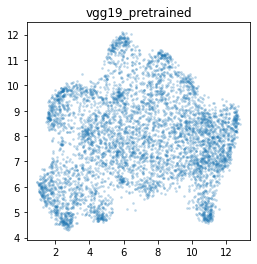

In [63]:
model_nickname = 'vgg19_pretrained'
draw_scatter(X_2d[model_nickname], model_nickname)

# 4. Check cluster of approximated embeddings of base model

In [40]:
raw_data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

raw_training_datasets = datasets.ImageFolder(
    '../../../../ILSVRC2012/train',
    raw_data_transform
)

def show_imgs(img_idxs):
    for img_idx in img_idxs:
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        plt.title(f'img: {img_idx}')
        plt.imshow(img)
        plt.show()
        
def show_np_imgs_2_rows(imgs, title=None, subplot_titles=None):
    # Create figure
    nrows = 2
    ncols = len(imgs) // nrows
    fig, ax = plt.subplots(nrows, ncols, figsize=(2 * ncols, 2 * nrows))
    fig.tight_layout()
    
    # Create subplots
    for i, img in enumerate(imgs[:nrows * ncols]):
        row = int(i / ncols)
        col = i - row * ncols
        ax[row, col].imshow(img) 
        ax[row, col].set_axis_off()
        if subplot_titles is not None:
            ax[row, col].set_title(subplot_titles[i])

    # Title
    if title is not None:
        fig.suptitle(title, y=1.06)
        
    # Show the final plot
    plt.show()
        
def show_imgs_2_rows(img_idxs, title=None):
    # Images
    imgs = []
    subplot_titles = []
    for i, img_idx in enumerate(img_idxs):
        img = raw_training_datasets[img_idx][0]
        img = np.einsum('kij->ijk', img)
        imgs.append(img)
        subplot_titles.append(f'{i}-th img: {img_idx}')
        
    # Show images
    show_np_imgs_2_rows(imgs, title=title, subplot_titles=subplot_titles)

In [44]:
def get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio):
    root = '/raid/NeuEvo/data/neuron_feature'
    return f'{root}/{model_nickname}/data/topk_s={topk_s}-ex_patch_size_ratio={ex_patch_size_ratio}'

def get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    d = get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio)
    paths = []
    for i in range(topk_s):
        paths.append(f'{d}/{layer}-{neuron_idx}-{i}.jpg')
    return paths

def load_img_from_path(p):
    if os.path.exists(p):
        img = cv2.imread(p)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        img = np.zeros((30, 30, 3))
    return img
                     
def show_ex_patch(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    img_ps = get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx)
    imgs = [load_img_from_path(img_path) for img_path in img_ps][:10]
    title = f'{model_nickname}, {layer}-{neuron_idx}'
    show_np_imgs_2_rows(imgs, title=title, subplot_titles=None)
    
def show_ex_patch_of_region(X, Y, X_2d, idx2id, model_nickname, topk_s=20, k=10, layer=None):
    target = {}
    for i, vec in enumerate(X_2d):
        x = vec[0]
        y = vec[1]
        if X[0] <= x <= X[1] and Y[0] <= y <= Y[1]:
            target[i] = True

    if layer is None:
        neurons = [idx2id[i] for i in target][:k]
    else:
        neurons = [idx2id[i] for i in target if layer in idx2id[i]][:k]

    for neuron in neurons:
        layer, neuron_idx = neuron.split('-')
        neuron_idx = int(neuron_idx)
        show_ex_patch(model_nickname, topk_s, 0.3, layer, neuron_idx)

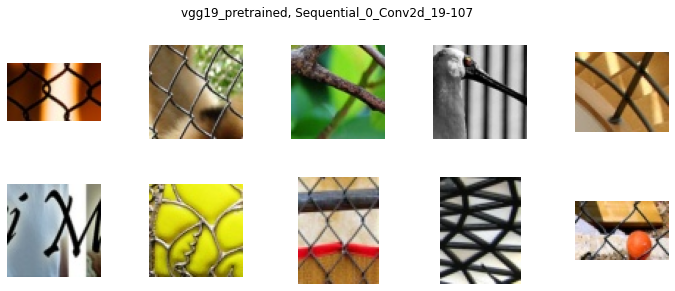

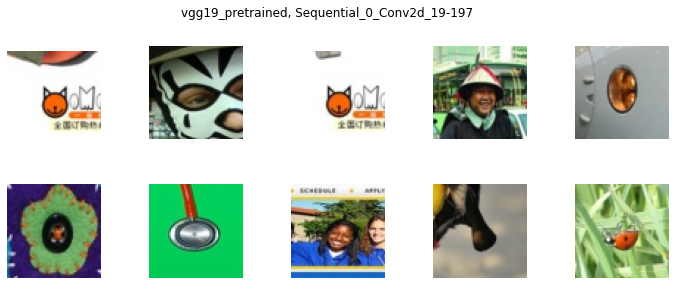

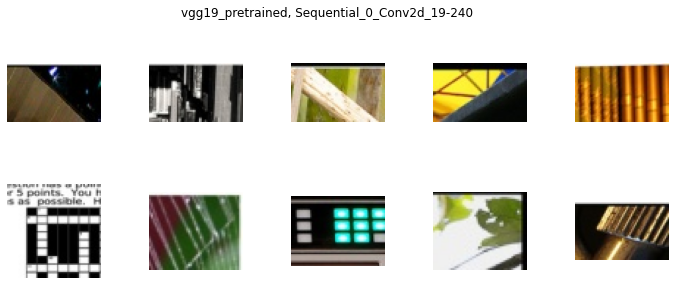

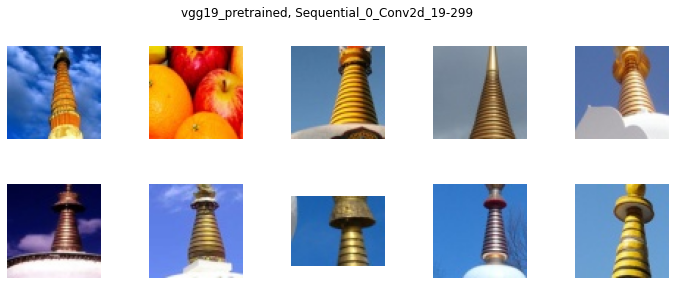

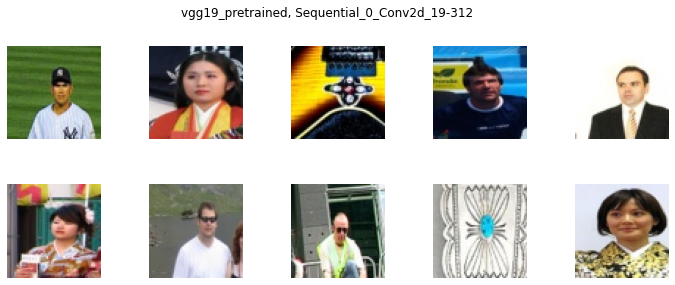

...

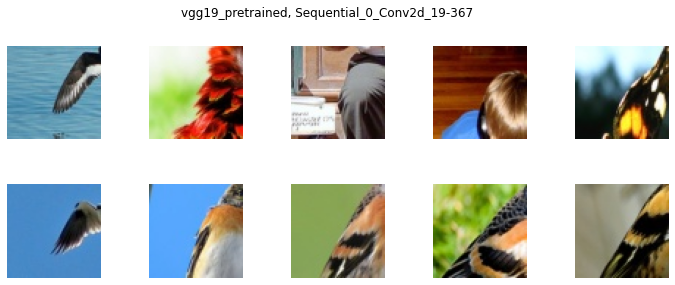

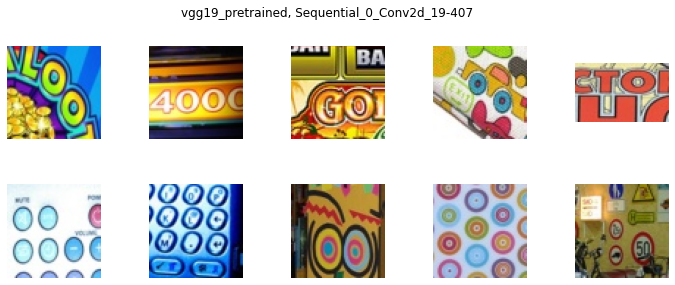

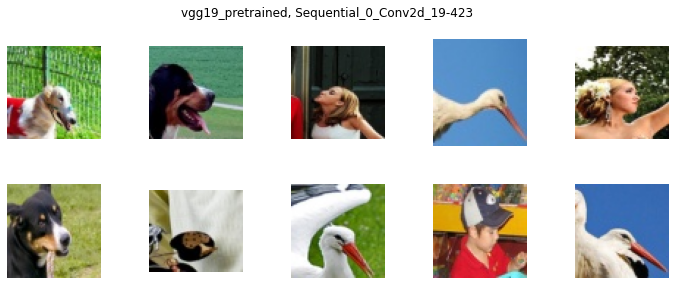

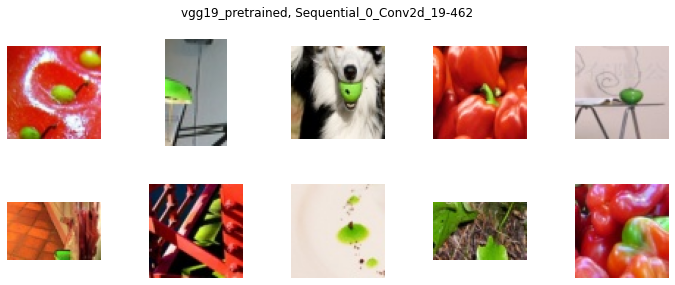

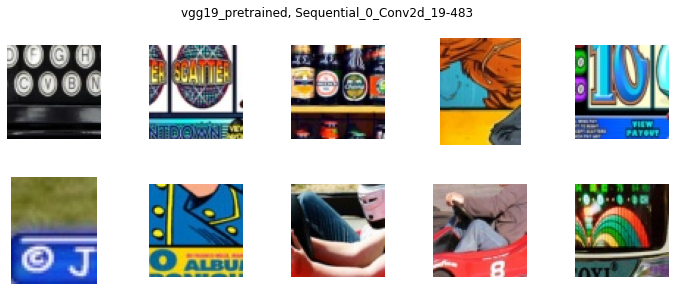

In [84]:
model_nickname = 'vgg19_pretrained'
show_ex_patch_of_region([2, 4], [9, 10], X_2d[model_nickname], idx2id[model_nickname], model_nickname, topk_s=15, layer='Conv2d_19', k=50)

# 5. VGG16

In [93]:
def gen_avg_img_vec(imgs, i_X, dim):
    avg_v = np.zeros(dim)
    for img in imgs:
        avg_v += i_X[img]
    avg_v /= len(imgs)
    return avg_v
    
def project_vector(model_nickname, i_X, vocab):
    # Get stimulus
    stimulus = load_stimulus(model_nickname, 20)
    
    # Get number of neurons
    num_neurons = 0
    for layer in stimulus:
        num_neurons += len(stimulus[layer])
        
    # Get projection vector
    dim = 30
    p_X = np.zeros((num_neurons, dim))
    n = 0
    for layer in stimulus:
        for neuron_stimuli in stimulus[layer]:
            imgs = [img for img in neuron_stimuli if img in vocab]
            if len(imgs) > 0:
                p_X[n] = gen_avg_img_vec(imgs, i_X, dim)
            # p_X[n] = gen_avg_img_vec(neuron_stimuli, i_X, dim)
            n += 1
    return p_X

def project_vector_with_mapping(model_nickname, i_X):
    # Get stimulus
    stimulus = load_stimulus(model_nickname)
    
    # Get number of neurons
    num_neurons = 0
    for layer in stimulus:
        num_neurons += len(stimulus[layer])

    # Get projection vector
    dim = 30
    p_X = np.zeros((num_neurons, dim))
    idx2id = {}
    n = 0
    for layer in stimulus:
        for neuron_idx, neuron_stimuli in enumerate(stimulus[layer]):
            p_X[n] = gen_avg_img_vec(neuron_stimuli, i_X, dim)
            idx2id[n] = f'{layer}-{neuron_idx}'
            n += 1
    return p_X, idx2id

def draw_projection(model_nickname, i_X, vocab):
    p_X = project_vector(model_nickname, i_X, vocab)
    p_X_2d = reduce_dim(p_X)
    draw_scatter(p_X_2d)

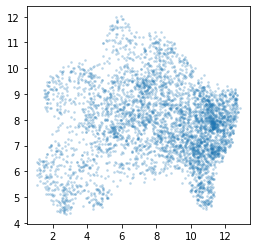

In [97]:
model_nickname = 'vgg16_0.01'
epoch = 0
key = f'{model_nickname}_{epoch}'

p_X_model, idx2id_model = project_vector_with_mapping(key, X_img)
X_approx[key] = p_X_model
idx2id[key] = idx2id_model

p_X_2d_model = reducer.transform(p_X_model)
X_2d[key] = p_X_2d_model
draw_scatter(p_X_2d_model)

# save_scatter(p_X_2d_model, os.path.join(fig_dir, f'{key}.pdf'), color='#7570b3')

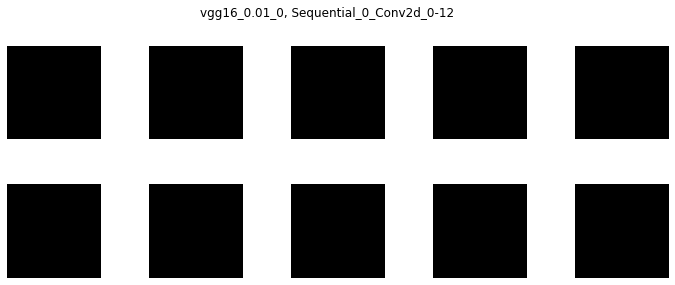

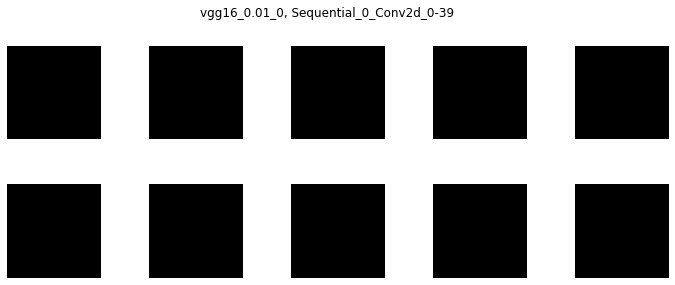

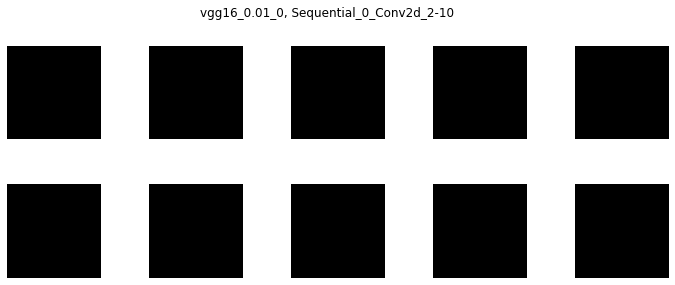

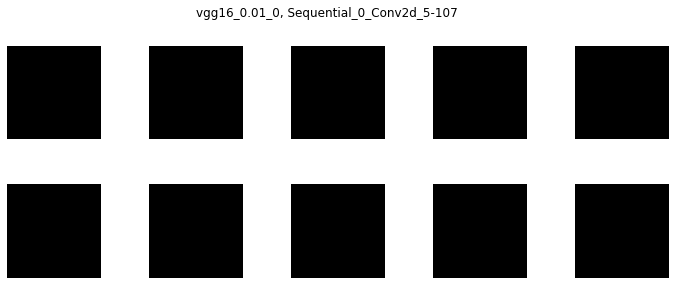

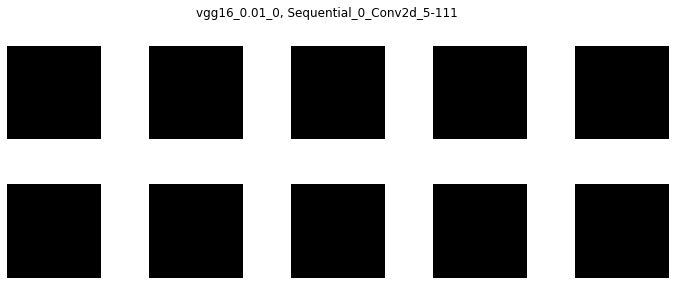

...

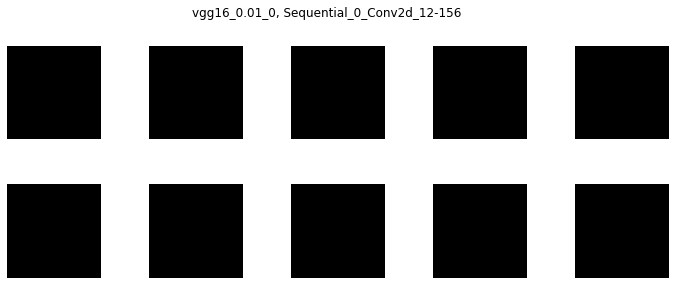

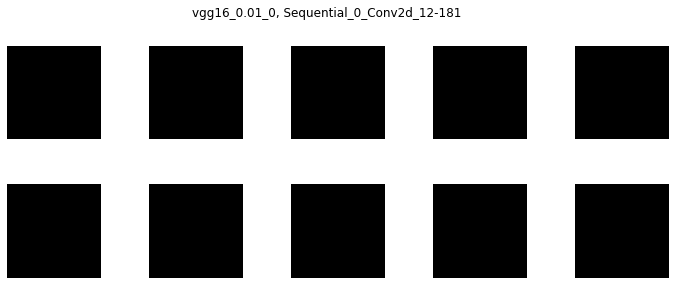

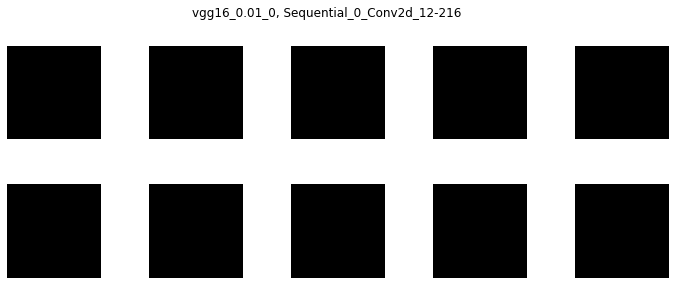

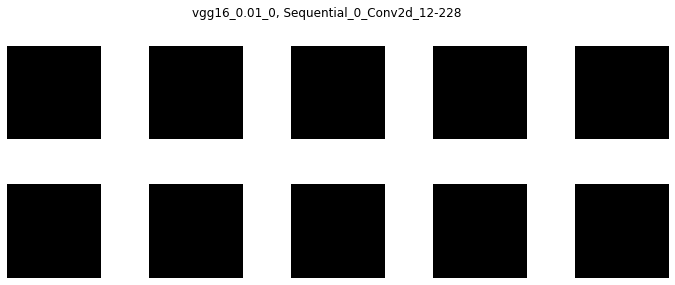

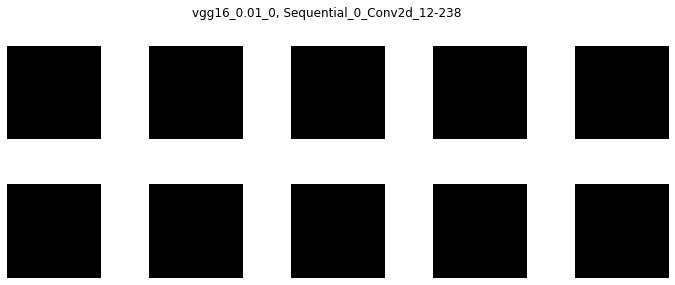

In [99]:
model_nickname = 'vgg16_0.01'
epoch = 0
key = f'{model_nickname}_{epoch}'
show_ex_patch_of_region([2, 4], [9, 10], X_2d[key], idx2id[key], key, topk_s=15, k=20)

In [40]:
def get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio):
    root = '/raid/NeuEvo/data/neuron_feature'
    return f'{root}/{model_nickname}/data/topk_s={topk_s}-ex_patch_size_ratio={ex_patch_size_ratio}'

def get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    d = get_ex_patch_dir_path(model_nickname, topk_s, ex_patch_size_ratio)
    paths = []
    for i in range(topk_s):
        paths.append(f'{d}/{layer}-{neuron_idx}-{i}.jpg')
    return paths

def load_img_from_path(p):
    img = cv2.imread(p)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img
                     
def show_ex_patch(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx):
    img_ps = get_ex_patch_img_paths(model_nickname, topk_s, ex_patch_size_ratio, layer, neuron_idx)
    imgs = [load_img_from_path(img_path) for img_path in img_ps]
    title = f'{model_nickname}, {layer}-{neuron_idx}'
    show_np_imgs_2_rows(imgs, title=title, subplot_titles=None)

In [70]:
p = '/raid/NeuEvo/data/stimulus/convnext_pretrained/data/stimulus-topk_s=20.json'
stimulus = load_json(p)

In [71]:
vocab = {}
for layer in stimulus:
    for imgs in stimulus[layer]:
        for img in imgs:
            if img not in vocab:
                vocab[img] = 0
            vocab[img] += 1
len(vocab)

97345

In [29]:
dim = 30
idx_to_neuron_id = {}
p_X = np.zeros((num_neurons, dim))
for n, neuron_id in enumerate(n_emb):
    layer, neuron_idx = neuron_id.split('-')
    neuron_idx = int(neuron_idx)
    imgs = stimulus[layer][neuron_idx]
    p_X[n] = gen_avg_img_vec(imgs, i_X, dim)
    idx_to_neuron_id[n] = neuron_id

In [30]:
p_X_2d = reduce_dim(p_X)

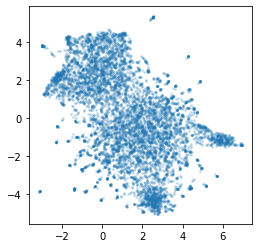

In [31]:
draw_scatter(p_X_2d)

In [32]:
p_X_2d.shape

(8640, 2)

In [68]:
Xs, Ys = p_X_2d[:,0], p_X_2d[:,1]

neurons = {}
for i, (x, y) in enumerate(zip(Xs, Ys)):
    if -4 <= x <= -2 and -4 <= y <= -2:
        neurons[idx_to_neuron_id[i]] = True

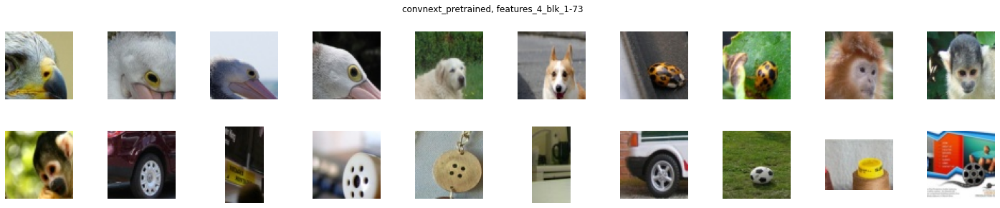

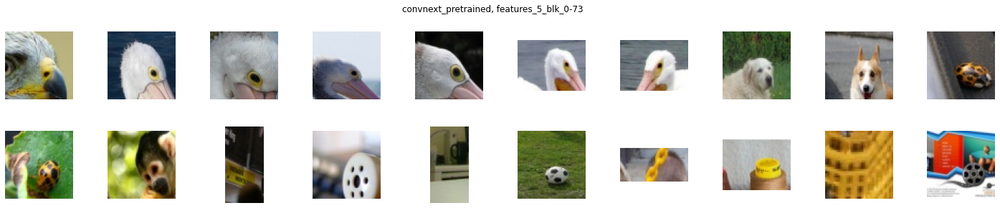

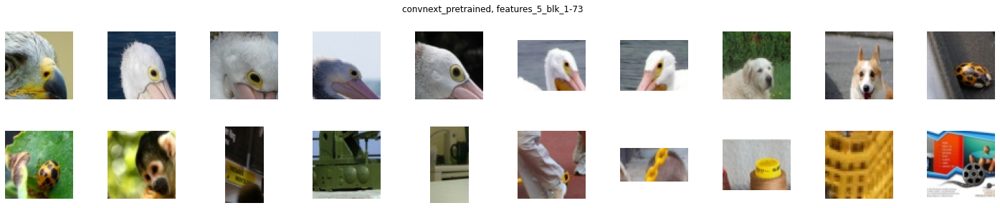

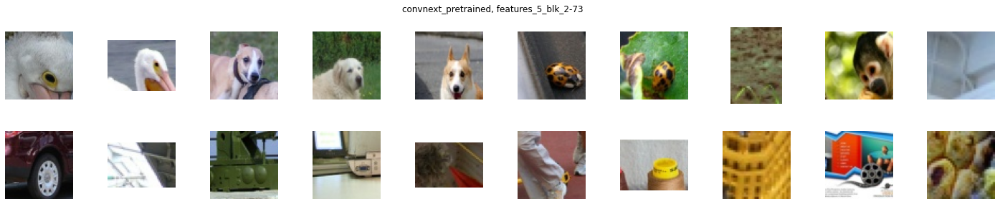

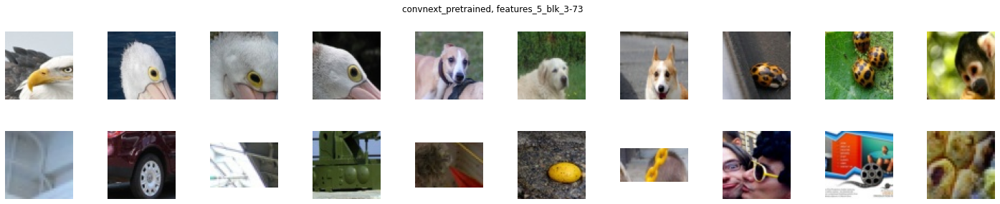

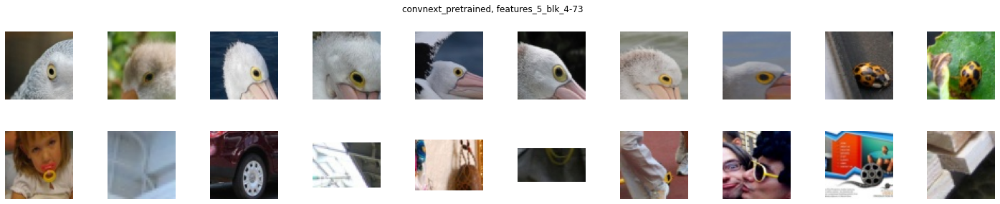

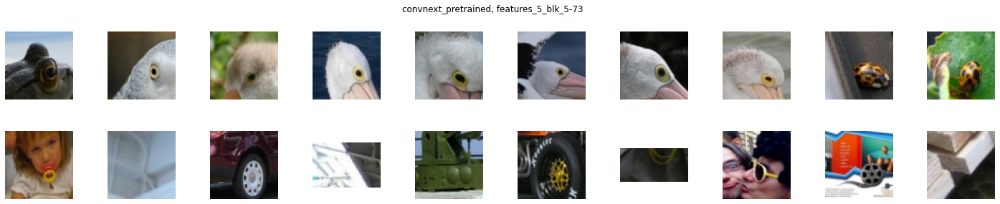

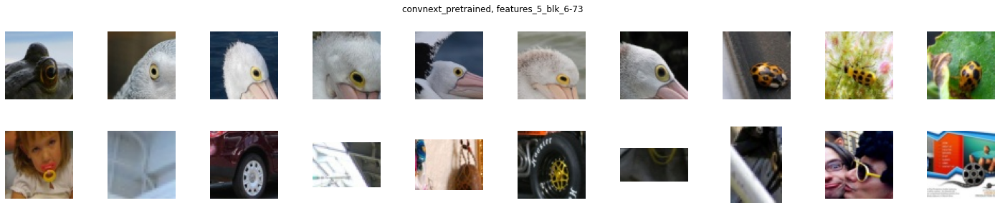

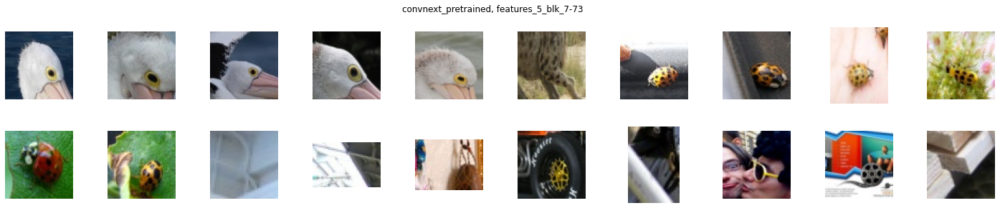

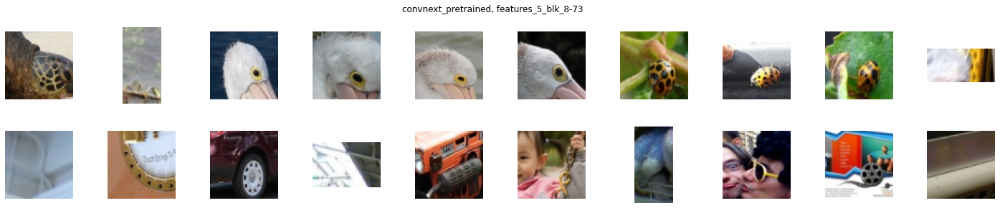

In [69]:
for neuron in list(neurons.keys())[:10]:
    layer, neuron_idx = neuron.split('-')
    neuron_idx = int(neuron_idx)
    show_ex_patch('convnext_pretrained', 20, 0.3, layer, neuron_idx)
    # show_imgs_2_rows(stimulus[layer][neuron_idx], title=neuron)

# A non-base model's projection

In [73]:
def load_stimulus(model_nickname):
    p = f'/raid/NeuEvo/data/stimulus/{model_nickname}/data/stimulus-topk_s=20.json'
    data = load_json(p)
    return data

def draw_projection(model_nickname, i_X, vocab):
    # Get stimulus
    stimulus = load_stimulus(model_nickname)
    
    # Get number of neurons
    num_neurons = 0
    for layer in stimulus:
        num_neurons += len(stimulus[layer])
        
    # Get projection vector
    dim = 30
    p_X = np.zeros((num_neurons, dim))
    n = 0
    for layer in stimulus:
        for neuron_stimuli in stimulus[layer]:
            imgs = [img for img in neuron_stimuli if img in vocab]
            if len(imgs) > 0:
                p_X[n] = gen_avg_img_vec(imgs, i_X, dim)
            n += 1
    
    # Draw 2D vectors
    p_X_2d = reduce_dim(p_X)
    draw_scatter(p_X_2d)

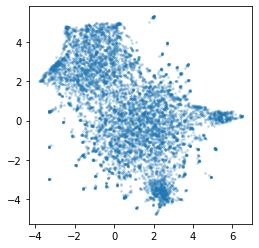

In [25]:
draw_projection('convnext_pretrained', i_X)

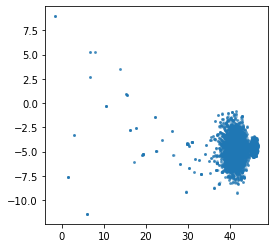

In [75]:
draw_projection('convnext_0.004_96', i_X, vocab)

In [74]:
draw_projection('convnext_0.004_96', i_X)

TypeError: draw_projection() missing 1 required positional argument: 'vocab'

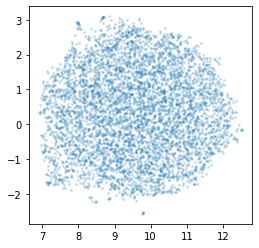

In [27]:
draw_projection('vgg19_pretrained', i_X)

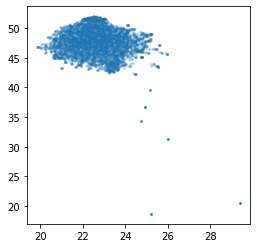

In [76]:
draw_projection('vgg19_pretrained', i_X, vocab)